In [53]:
#https://drive.google.com/file/d/1V-ubVnKKbolY8i47f5kVza1egxCZ1qkA/view?usp=sharing

In [54]:
!gdown --id 1V-ubVnKKbolY8i47f5kVza1egxCZ1qkA 

Downloading...
From: https://drive.google.com/uc?id=1V-ubVnKKbolY8i47f5kVza1egxCZ1qkA
To: /content/Twitter_Data.csv
100% 20.9M/20.9M [00:00<00:00, 44.9MB/s]


In [55]:
import pandas as pd
import numpy as np
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib import rc

from sklearn.metrics import confusion_matrix, classification_report

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]

In [56]:
from wordcloud import WordCloud
import nltk
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score, classification_report,confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.calibration import calibration_curve
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, classification_report


In [57]:
df = pd.read_csv("Twitter_Data.csv")
df.head()

,clean_text,category
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0


In [58]:
df.category.unique()

array([-1.,  0.,  1., nan])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


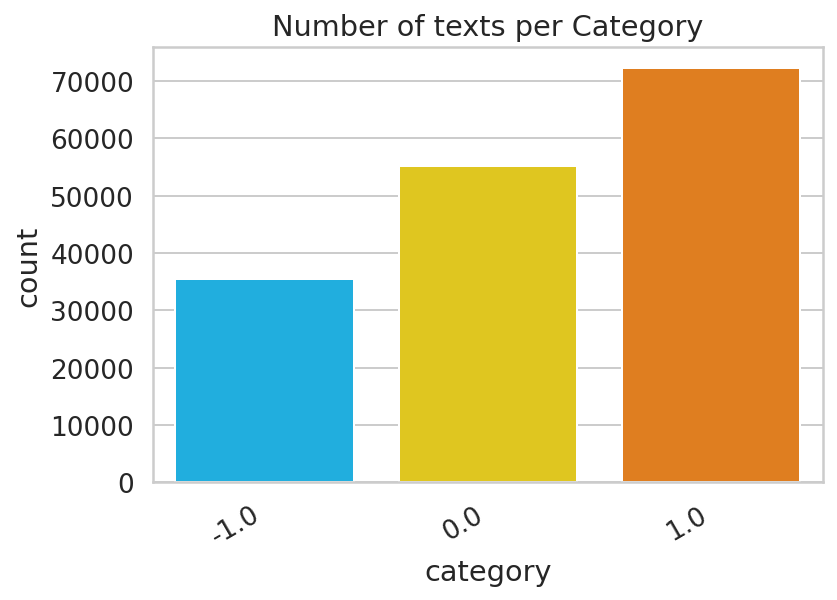

In [59]:
chart = sns.countplot(df.category, palette=HAPPY_COLORS_PALETTE)
plt.title("Number of texts per Category")
chart.set_xticklabels(chart.get_xticklabels(), rotation=30, horizontalalignment='right');

In [60]:
df['category'].value_counts()

 1.0    72250
 0.0    55213
-1.0    35510
Name: category, dtype: int64

the values with NULL

In [61]:
np.sum(df.isnull().any(axis=1))

11

**Removed all num Values**

In [62]:
np.sum(df.isnull().any(axis=1))

11

Defining a Stop words list

In [63]:
df[df['category'].isna()]

,clean_text,category
130448,the foundation stone northeast gas grid inaugu...,NaN
155642,dear terrorists you can run but you cant hide ...,NaN
155698,offense the best defence with mission shakti m...,NaN
155770,have always heard politicians backing out thei...,NaN
158693,modi government plans felicitate the faceless ...,NaN
159442,chidambaram gives praises modinomics,NaN
160559,the reason why modi contested from seats 2014 ...,NaN


In [64]:
df.drop(df[df['clean_text'].isna()].index, inplace=True)
df.drop(df[df['category'].isna()].index, inplace=True)

In [65]:
df

,clean_text,category
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0
...,...,...
162975,why these 456 crores paid neerav modi not reco...,-1.0
162976,dear rss terrorist payal gawar what about modi...,-1.0
162977,did you cover her interaction forum where she ...,0.0
162978,there big project came into india modi dream p...,0.0


In [66]:
np.sum(df.isnull().any(axis=1))

0

# word cloud is the only visualiztion i know for nlp so, lets do **it**

In [67]:
import nltk

In [68]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [69]:
df['clean_text']

0         when modi promised “minimum government maximum...
1         talk all the nonsense and continue all the dra...
2         what did just say vote for modi  welcome bjp t...
3         asking his supporters prefix chowkidar their n...
4         answer who among these the most powerful world...
                                ...                        
162975    why these 456 crores paid neerav modi not reco...
162976    dear rss terrorist payal gawar what about modi...
162977    did you cover her interaction forum where she ...
162978    there big project came into india modi dream p...
162979    have you ever listen about like gurukul where ...
Name: clean_text, Length: 162969, dtype: object

Create a positive wordcloud and visualization 

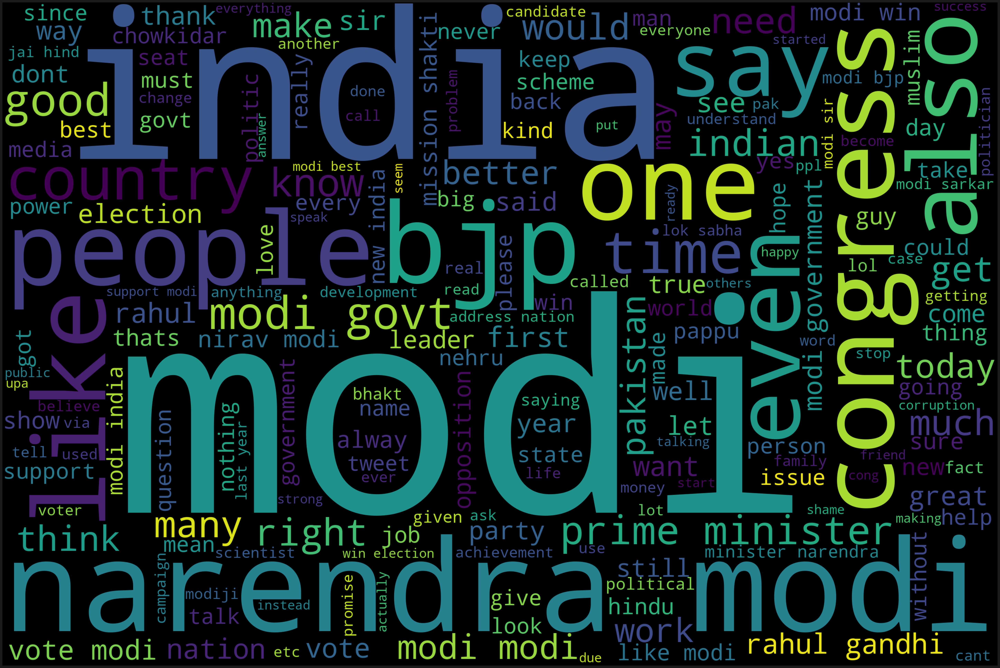

In [70]:
text = ''

for tweet in df[df['category'] == 1.0]['clean_text']:
    text += f" {tweet}"
# print(text)
    
wordcloud = WordCloud(
width=3000, height=2000, background_color='black',
stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)

fig = plt.figure(figsize=(40,30), facecolor='k',edgecolor='k')

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show

del text

Create a negative word visualisation

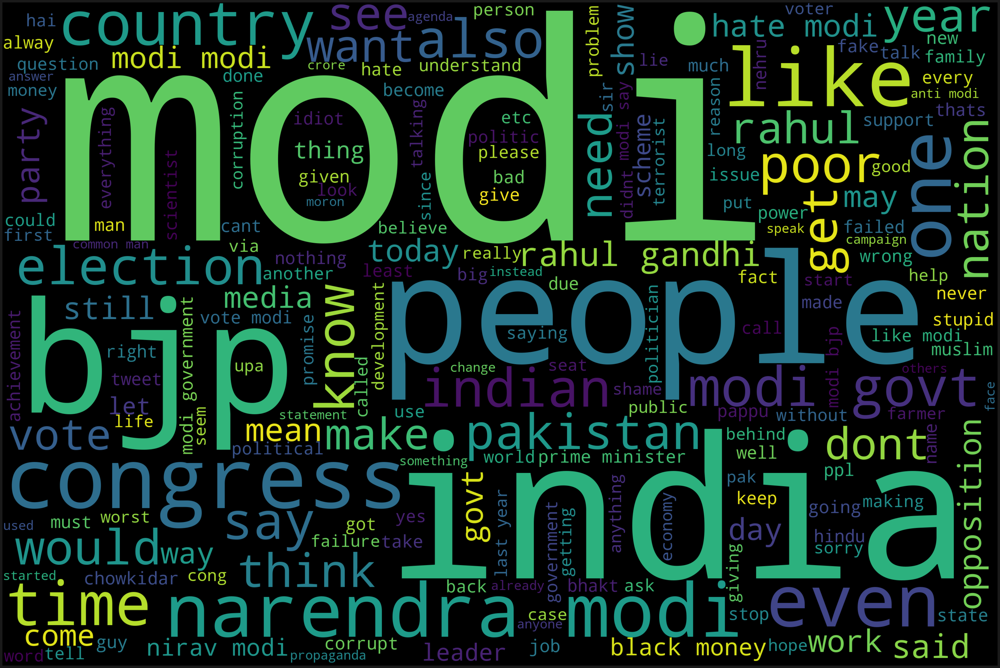

In [71]:
# negative tweets

text = ''

for tweet in df[df['category'] == -1.0 ]['clean_text']:
    text += f" {tweet}"
    
wordcloud = WordCloud(
width=3000, height=2000, background_color='black',
stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)

fig = plt.figure(figsize=(40,30), facecolor='k',edgecolor='k')

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show

del text

Create  a neutral data based visualisation

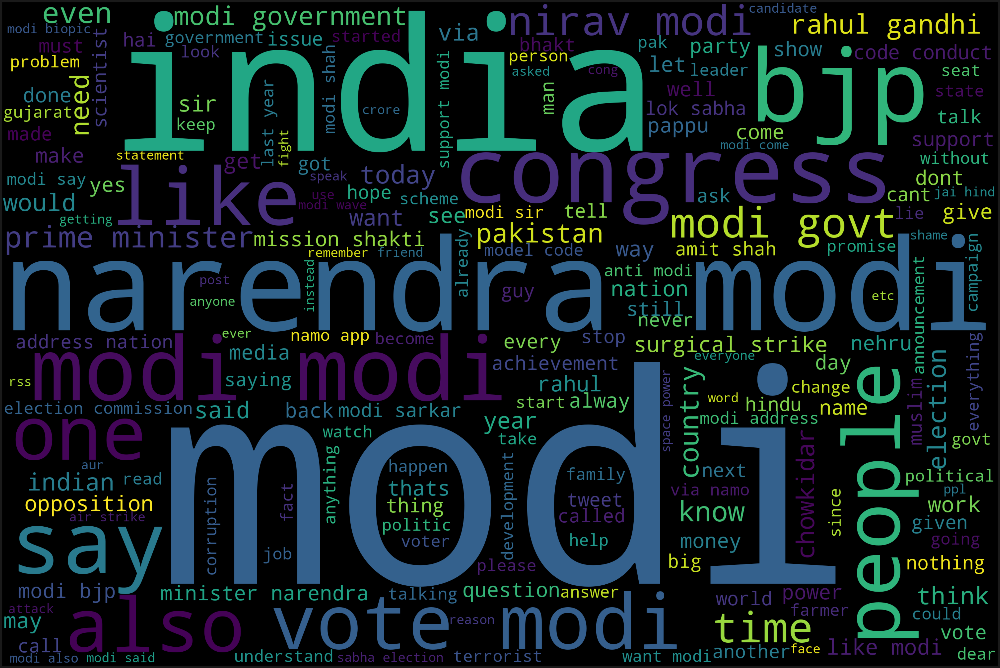

In [72]:
# neutral Tweets

text = ''

for tweet in df[df['category'] == 0.0 ]['clean_text']:
    text += f" {tweet}"
    
wordcloud = WordCloud(
width=3000, height=2000, background_color='black',
stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)

fig = plt.figure(figsize=(40,30), facecolor='k',edgecolor='k')

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show

del text

In [73]:
X=df.clean_text
y=df.category

In [74]:
print(X)

0         when modi promised “minimum government maximum...
1         talk all the nonsense and continue all the dra...
2         what did just say vote for modi  welcome bjp t...
3         asking his supporters prefix chowkidar their n...
4         answer who among these the most powerful world...
                                ...                        
162975    why these 456 crores paid neerav modi not reco...
162976    dear rss terrorist payal gawar what about modi...
162977    did you cover her interaction forum where she ...
162978    there big project came into india modi dream p...
162979    have you ever listen about like gurukul where ...
Name: clean_text, Length: 162969, dtype: object


splitting the dataset into trian and test

In [75]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3, random_state =26105111)

In [76]:
vectoriser = TfidfVectorizer(ngram_range=(1,2), max_features=500000)
vectoriser.fit(X_train)
print('No. of feature_words: ', len(vectoriser.get_feature_names()))

No. of feature_words:  500000


In [77]:
X_train = vectoriser.transform(X_train)
X_test  = vectoriser.transform(X_test)

In [78]:
BNBmodel = BernoulliNB()
BNBmodel.fit(X_train, y_train)
# model_Evaluate(BNBmodel)
y_pred1 = BNBmodel.predict(X_test)

In [79]:
print(classification_report(y_test, y_pred1))
  # Compute and plot the Confusion matrix
cf_matrix = confusion_matrix(y_test, y_pred1)

              precision    recall  f1-score   support

        -1.0       0.84      0.22      0.35     10668
         0.0       0.72      0.86      0.78     16562
         1.0       0.69      0.84      0.76     21661

    accuracy                           0.71     48891
   macro avg       0.75      0.64      0.63     48891
weighted avg       0.73      0.71      0.68     48891



In [80]:
SVCmodel = LinearSVC()
SVCmodel.fit(X_train, y_train)
# model_Evaluate(SVCmodel)
y_pred2 = SVCmodel.predict(X_test)

In [81]:
print(classification_report(y_test, y_pred2))
  # Compute and plot the Confusion matrix
cf_matrix = confusion_matrix(y_test, y_pred2)

              precision    recall  f1-score   support

        -1.0       0.92      0.85      0.88     10668
         0.0       0.94      0.96      0.95     16562
         1.0       0.93      0.95      0.94     21661

    accuracy                           0.93     48891
   macro avg       0.93      0.92      0.92     48891
weighted avg       0.93      0.93      0.93     48891



In [82]:
LRmodel = LogisticRegression(C = 2, max_iter = 1000, n_jobs=-1)
LRmodel.fit(X_train, y_train)
# model_Evaluate(LRmodel)
y_pred3 = LRmodel.predict(X_test)

In [83]:
print(classification_report(y_test, y_pred3))
  # Compute and plot the Confusion matrix
cf_matrix = confusion_matrix(y_test, y_pred3)

              precision    recall  f1-score   support

        -1.0       0.91      0.80      0.85     10668
         0.0       0.91      0.95      0.93     16562
         1.0       0.92      0.93      0.92     21661

    accuracy                           0.91     48891
   macro avg       0.91      0.90      0.90     48891
weighted avg       0.91      0.91      0.91     48891



Trying on random data

In [84]:
y_testnew=['This is a bad goverment','I love modi and his ideal system.']

In [85]:
y_testnew=vectoriser.transform(y_testnew)

In [86]:
SVCmodel.predict(y_testnew)

array([-1.,  1.])